In [ ]:
!pip install diffusers transformers accelerate -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.4/297.4 kB 28.9 MB/s eta 0:00:00


In [ ]:
from diffusers import StableDiffusionPipeline, UNet2DConditionModel
from diffusers.utils import make_image_grid
import torch
import time

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [ ]:
prompts = ["The North Face White Label Novelty Nuptse Down Jacket Ice Gray, a photography of a white down jacket with a grey hood",
           "Auralee Super Fine Wool Twill Melton Chesterfield Coat Beige Chambray - 23AW, a photography of a coat with a long lapel collar",
           "A.P.C. Item T-Shirt Black, a photography of a black long sleeved t - shirt with a white logo on the chest",
           "black jacket with the word echo on it",
           "Our Legacy Vast Cut Blue Brush Stroke Print, a photography of a pair of jeans with a blue and white pattern"]

Original Distilled Stable Diffustion Model


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Execution time: 60.30 seconds


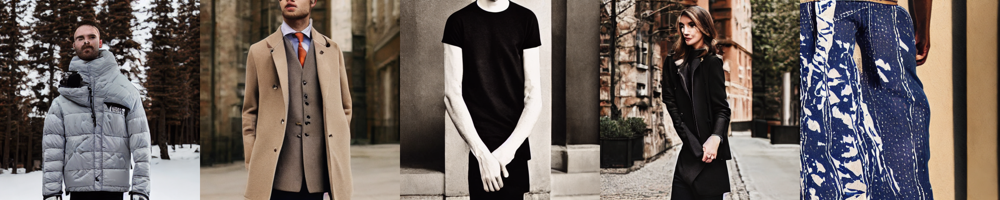

In [ ]:
print("Original Distilled Stable Diffustion Model")
model_original_path = "/content/drive/MyDrive/Datasets/sdp_1_model_distilled"
model_original = StableDiffusionPipeline.from_pretrained(
    model_original_path,
    # torch_dtype=torch.float16,
    use_safetensors=True)
model_original.to("cuda")

generator = [torch.Generator("cuda").manual_seed(1) for _ in range(len(prompts))]
start_time = time.time()
images_original = model_original(prompts,
                        num_images_per_prompt=1,
                        generator=generator).images
end_time = time.time()

execution_time = end_time - start_time
print("Execution time: {:.2f} seconds".format(execution_time))
make_image_grid(images_original, rows = 1, cols=5)

Checkpoint - 100 optimization steps


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Execution time: 60.34 seconds


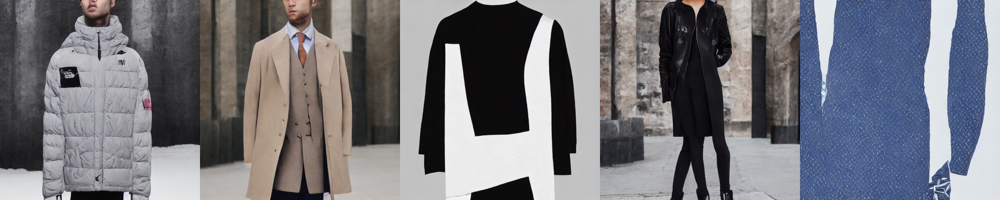

In [ ]:
torch.cuda.empty_cache()
print("Checkpoint - 100 optimization steps")
model_100_path = "/content/drive/MyDrive/Datasets/model_logs"
unet_100 = UNet2DConditionModel.from_pretrained(model_100_path + "/checkpoint-100/unet")
model_100 = StableDiffusionPipeline.from_pretrained(
    model_original_path,
    unet=unet_100,
    # torch_dtype=torch.float16,
    use_safetensors=True)
model_100.to("cuda")

generator = [torch.Generator("cuda").manual_seed(1) for _ in range(len(prompts))]
start_time = time.time()
images = model_100(prompts,
                        num_images_per_prompt=1,
                        generator=generator).images
end_time = time.time()
execution_time = end_time - start_time
print("Execution time: {:.2f} seconds".format(execution_time))
make_image_grid(images, rows = 1, cols=5)

Checkpoint - 200 optimization steps


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Execution time: 61.03 seconds


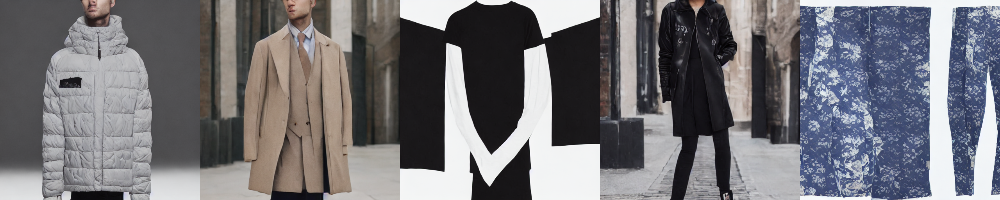

In [ ]:
torch.cuda.empty_cache()
print("Checkpoint - 200 optimization steps")
model_200_path = "/content/drive/MyDrive/Datasets/model_logs"
unet_200 = UNet2DConditionModel.from_pretrained(model_200_path + "/checkpoint-200/unet")
model_200 = StableDiffusionPipeline.from_pretrained(
    model_original_path,
    unet=unet_200,
    # torch_dtype=torch.float16,
    use_safetensors=True)
model_200.to("cuda")

generator = [torch.Generator("cuda").manual_seed(1) for _ in range(len(prompts))]
start_time = time.time()
images = model_200(prompts,
                        num_images_per_prompt=1,
                        generator=generator).images
end_time = time.time()
execution_time = end_time - start_time
print("Execution time: {:.2f} seconds".format(execution_time))
make_image_grid(images, rows = 1, cols=5)

Checkpoint - 300 optimization steps


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Execution time: 64.24 seconds


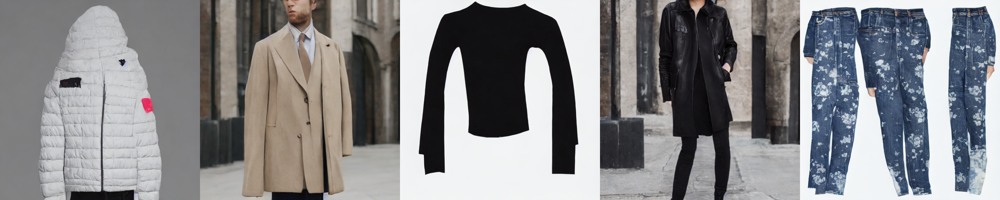

In [ ]:
torch.cuda.empty_cache()
print("Checkpoint - 300 optimization steps")
model_300_path = "/content/drive/MyDrive/Datasets/model_logs"
unet_300 = UNet2DConditionModel.from_pretrained(model_300_path + "/checkpoint-300/unet")
model_300 = StableDiffusionPipeline.from_pretrained(
    model_original_path,
    unet=unet_300,
    # torch_dtype=torch.float16,
    use_safetensors=True)
model_300.to("cuda")
torch.cuda.empty_cache()
generator = [torch.Generator("cuda").manual_seed(1) for _ in range(len(prompts))]
start_time = time.time()
images = model_300(prompts,
                        num_images_per_prompt=1,
                        generator=generator).images
end_time = time.time()
execution_time = end_time - start_time
print("Execution time: {:.2f} seconds".format(execution_time))
make_image_grid(images, rows = 1, cols=5)

FIne Tuned Distilled Stable Diffustion Model


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Execution time: 61.15 seconds


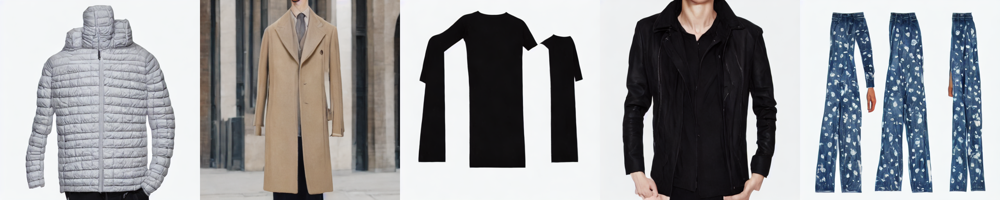

In [ ]:
torch.cuda.empty_cache()
print("FIne Tuned Distilled Stable Diffustion Model")
model_finetuned_path = "/content/drive/MyDrive/Datasets/fine_tuned_model"
model_finetuned = StableDiffusionPipeline.from_pretrained(model_finetuned_path, use_safetensors=True)
model_finetuned.to("cuda")

generator = [torch.Generator("cuda").manual_seed(1) for _ in range(len(prompts))]
start_time = time.time()
images_finetuned = model_finetuned(prompts,
                        num_images_per_prompt=1,
                        generator=generator).images
end_time = time.time()
execution_time = end_time - start_time
print("Execution time: {:.2f} seconds".format(execution_time))
make_image_grid(images_finetuned, rows = 1, cols=5)

FIne Tuned Distilled Stable Diffustion Model to compare similar image


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


Execution time: 21.76 seconds


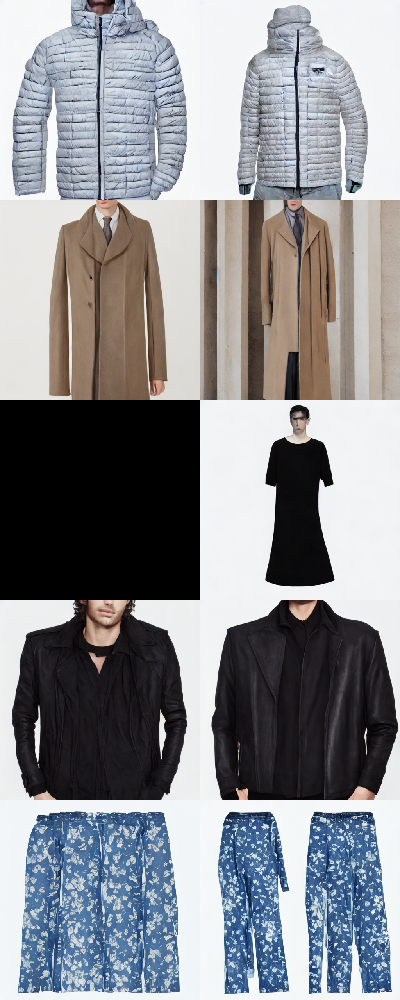

In [ ]:
torch.cuda.empty_cache()
print("FIne Tuned Distilled Stable Diffustion Model to compare similar image")
model_finetuned_path = "/content/drive/MyDrive/Datasets/fine_tuned_model"
model_finetuned = StableDiffusionPipeline.from_pretrained(
    model_finetuned_path,
    torch_dtype=torch.float16,
    use_safetensors=False)
model_finetuned.to("cuda")
seed = 0
generator = torch.manual_seed(seed)
torch.cuda.empty_cache()
start_time = time.time()
images = model_finetuned(prompts,
                        num_images_per_prompt=2,
                        generator=generator,
                        num_inference_steps=25).images
end_time = time.time()
execution_time = end_time - start_time
print("Execution time: {:.2f} seconds".format(execution_time))
make_image_grid(images, rows = 5, cols=2)

In [ ]:
!pip install torchmetrics -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 841.5/841.5 kB 4.9 MB/s eta 0:00:00


In [ ]:
from torchmetrics.functional.multimodal import clip_score
from functools import partial
import numpy as np

In [ ]:
# Evaluate the diffusion model based on clip score
clip_score_fn = partial(clip_score, model_name_or_path="openai/clip-vit-base-patch16")

def calculate_clip_score(images, prompts):
    images_np = np.array(images)
    images_int = (images_np * 255).astype("uint8")
    clip_score = clip_score_fn(torch.from_numpy(images_int).permute(0, 3, 1, 2), prompts).detach()
    return round(float(clip_score), 4)

sd_clip_score_original = calculate_clip_score(images_original, prompts)
print(f"CLIP Score with original: {sd_clip_score_original}")

sd_clip_score_finetuned = calculate_clip_score(images_finetuned, prompts)
print(f"CLIP Score with finetuned: {sd_clip_score_finetuned}")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/4.10k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/599M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/905 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/961k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

CLIP Score with original: 26.8069
CLIP Score with finetuned: 29.8147


In [ ]:
import matplotlib.pyplot as plt
import json

In [ ]:

train_loss_data_path = "/content/drive/MyDrive/Datasets/fine_tuned_model/training_history.json"
with open(train_loss_data_path, 'r') as file:
    train_loss_data = json.load(file)

In [ ]:
num_epochs = len(train_loss_data["epoch_losses"])
epochs_loss = train_loss_data["epoch_losses"]
num_steps = len(train_loss_data["steps_losses"])
steps_loss = train_loss_data["steps_losses"]

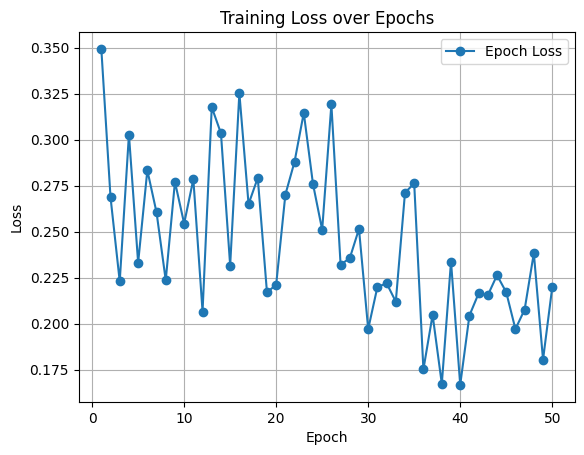

In [ ]:
plt.plot(range(1, num_epochs+1), epochs_loss, marker='o', label='Epoch Loss')

plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss over Epochs')
plt.legend()
plt.grid(True)
plt.show()

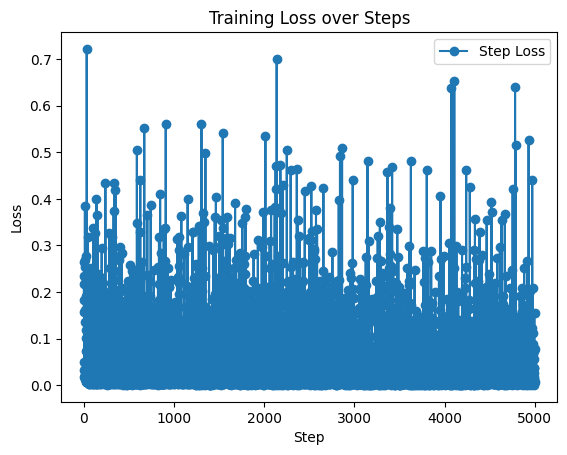

In [ ]:
plt.plot(range(1, num_steps+1), steps_loss, marker='o', label='Step Loss')

plt.xlabel('Step')
plt.ylabel('Loss')
plt.title('Training Loss over Steps')
plt.legend()
plt.show()